# Import Libraries and Load Dataset

## Libaries and HyperParameters

In [1]:
# Standard library imports
import os
import glob

from PIL import Image
import torch
import torchvision.transforms as T
import torch.nn.functional as F
import torch.nn as nn
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
import math
import functools
from tqdm import tqdm
import random


In [2]:
# --------------------------- Hyperparameters ---------------------------
os.environ['LOKY_MAX_CPU_COUNT '] = '10'
device      = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size  = 16
stage1_epochs = 15
stage2_epochs = 15
n_visualize = 3  # Number of epochs to visualize images

pix2pix_arg = dict(
    lr          = 1e-4,
    beta1       = 0.5,
    beta2       = 0.999,
    lambda_cyc = 10.0,
    lambda_L1  = 100.0,
    lambda_id  = 5.0,
    gen_attention = False,
    disc_attention = False
)


# root='../Dataset'
root='/kaggle/input/reference/Dataset'
paired_args = dict(
    root=root,
    dir_A="camera_images_real_front",
    dir_B="camera_images_semantic_front",
    load_size=286,
    crop_size=256,
    no_flip=False,
    val_split=0.1,
    test_split=0.1,
    seed=42
)
unpaired_args = dict(root_dir=os.path.join(root, 'camera_images_real_front'))

os.makedirs('results/stage1', exist_ok=True)
os.makedirs('results/stage2', exist_ok=True)
os.makedirs('results/test', exist_ok=True)
os.makedirs('checkpoints', exist_ok=True)

## Loading dataset + Preprocessing

### Dataset for Stage 1

In [ ]:
class PairedImageDataset(Dataset):
    """
    Simplified paired image dataset class for Pix2Pix-like models.

    Parameters:
    - root: dataset root directory containing subfolders dir_A and dir_B
    - dir_A: name of domain A folder (e.g., 'camera_images_real_front')
    - dir_B: name of domain B folder (e.g., 'camera_images_semantic_front')
    - phase: dataset phase ('train', 'val', or 'test')
    - direction: mapping direction ('AtoB' or 'BtoA')
    - load_size: image size before cropping
    - crop_size: final crop size
    - no_flip: disable random horizontal flipping
    - val_split/test_split: fractions for validation and testing
    - seed: random seed for reproducibility

    Proprocessing + Augmentation Pipeline:
        1) Load and sort image paths from domain A and B
        2) Split dataset into train/val/test using consistent indexing
        3) Resize images to load_size
        4) Randomly crop images to crop_size
        5) Randomly flip images horizontally (if no_flip is False)
        6) Convert images to tensors and normalize them
    """

    def __init__(self,
                 root: str,
                 dir_A: str,
                 dir_B: str,
                 phase: str = 'train',      # 'train' | 'val' | 'test'
                 direction: str = 'AtoB',   # 'AtoB' or 'BtoA'
                 load_size: int = 286,
                 crop_size: int = 256,
                 no_flip: bool = False,
                 val_split: float = 0.1,
                 test_split: float = 0.1,
                 seed: int = 42):
        super().__init__()
        assert direction in ['AtoB', 'BtoA'], "direction must be 'AtoB' or 'BtoA'"

        A_paths = sorted(glob.glob(os.path.join(root, dir_A, '*.*')))
        B_paths = sorted(glob.glob(os.path.join(root, dir_B, '*.*')))
        if len(A_paths) == 0 or len(B_paths) == 0:
            raise ValueError("No images found in the specified directories.")
        assert len(A_paths) == len(B_paths), "Number of images in A and B must match"

        A_names = [os.path.basename(path) for path in A_paths]
        B_names = [os.path.basename(path) for path in B_paths]
        assert A_names == B_names, "Image names in A and B must match"

        idx = list(range(len(A_paths)))
        trainval_idx, test_idx = train_test_split(idx, test_size=test_split, random_state=seed)
        train_idx, val_idx = train_test_split(trainval_idx, test_size=val_split / (1 - test_split), random_state=seed)
        if phase == 'train':
            sel = train_idx
        elif phase == 'val':
            sel = val_idx
        else:
            sel = test_idx
        
        self.A_paths = [A_paths[i] for i in sel]
        self.B_paths = [B_paths[i] for i in sel]
        self.direction = direction

        if phase in ('train', 'val'):
            self.transform_A = self.transform_B = T.Compose([
                T.Resize(load_size, Image.BICUBIC),
                T.RandomCrop(crop_size),
                T.RandomHorizontalFlip() if not no_flip else T.Lambda(lambda x: x),
                # T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
                T.ToTensor(),
                T.Normalize((0.5,)*3, (0.5,)*3)
            ])
        else:
            self.transform_A = self.transform_B = T.Compose([
                T.Resize(crop_size, interpolation=Image.BICUBIC),
                T.CenterCrop(crop_size),
                T.ToTensor(),
                T.Normalize((0.5,)*3, (0.5,)*3)
            ])

    def __len__(self):
        return len(self.A_paths)
    
    def __getitem__(self, idx):
        # Load paired images
        A = Image.open(self.A_paths[idx]).convert('RGB')
        B = Image.open(self.B_paths[idx]).convert('RGB')

        # Ensure synchronized random crop and flip by reusing seed
        seed = torch.seed()
        torch.manual_seed(seed)
        A = self.transform_A(A)
        torch.manual_seed(seed)
        B = self.transform_B(B)

        # Swap if direction is BtoA
        if self.direction == 'BtoA':
            A, B = B, A

        return {'A': A, 'B': B, 'path': os.path.basename(self.A_paths[idx])}


In [4]:
pairs = {}
for direction in ['AtoB', 'BtoA']:
    ds_train = PairedImageDataset(phase='train', direction=direction, **paired_args)
    ds_val   = PairedImageDataset(phase='val',   direction=direction, **paired_args)
    ds_test  = PairedImageDataset(phase='test',  direction=direction, **paired_args)
    pairs[direction] = {
        
        'train': DataLoader(ds_train, batch_size, shuffle=True),
        'val':   DataLoader(ds_val,   batch_size, shuffle=True),
        'test':  DataLoader(ds_test,  batch_size, shuffle=False)
    }

Displayed 4 pairs for each direction: ['AtoB', 'BtoA']


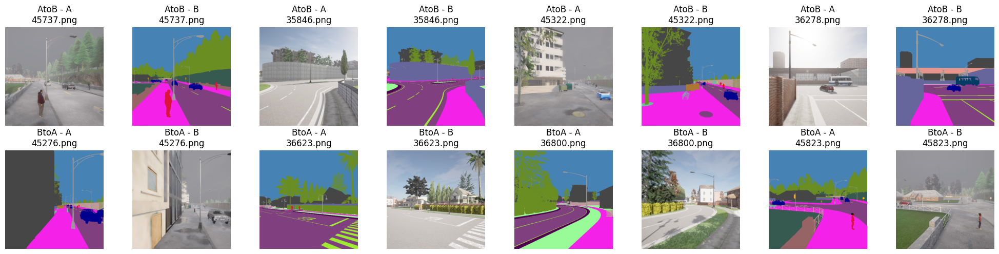

In [5]:
fig, axes = plt.subplots(nrows=2, ncols=8, figsize=(20, 5))  # Adjusted nrows to 2
axes = axes.flatten()

directions = ['AtoB', 'BtoA']
for d_idx, direction in enumerate(directions):
    for idx, batch in enumerate(pairs[direction]['train']):
        images, masks, paths = batch['A'], batch['B'], batch['path']
        if idx >= 4:  # Limit to 4 pairs per direction
            break
        # Convert tensors to numpy arrays for visualization
        image_np = images[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5  # Move to CPU and denormalize to [0, 1]
        mask_np = masks[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5    # Move to CPU and denormalize to [0, 1]

        # Extract filenames
        filename = os.path.basename(paths[0])

        # Display image
        axes[2 * idx + d_idx * 8].imshow(image_np)
        axes[2 * idx + d_idx * 8].set_title(f"{direction} - A\n{filename}")
        axes[2 * idx + d_idx * 8].axis("off")

        # Display mask
        axes[2 * idx + 1 + d_idx * 8].imshow(mask_np)
        axes[2 * idx + 1 + d_idx * 8].set_title(f"{direction} - B\n{filename}")
        axes[2 * idx + 1 + d_idx * 8].axis("off")

print(f"Displayed 4 pairs for each direction: {directions}")
plt.tight_layout()
plt.show()

### Dataset for Stage 2

In [6]:
class UnpairedImageDataset(Dataset):
    def __init__(self, root_dir, phase='train', split_ratios=(0.8, 0.1, 0.1), seed=42,
                 load_size=286, crop_size=256, no_flip=False):
        paths = sorted(glob.glob(os.path.join(root_dir, '*.*')))
        total = len(paths)
        n_train = int(split_ratios[0] * total)
        n_val = int(split_ratios[1] * total)
        random.seed(seed)
        random.shuffle(paths)

        if phase == 'train':
            self.paths = paths[:n_train]
        elif phase == 'val':
            self.paths = paths[n_train:n_train + n_val]
        else:
            self.paths = paths[n_train + n_val:]

        if phase == 'train':
            self.transform = T.Compose([
                T.Resize(load_size, interpolation=Image.BICUBIC),
                T.RandomCrop(crop_size),
                T.RandomHorizontalFlip() if not no_flip else T.Lambda(lambda x: x),
                T.ToTensor(),
                T.Normalize((0.5,)*3, (0.5,)*3)
            ])
        else:
            self.transform = T.Compose([
                T.Resize(crop_size, interpolation=Image.BICUBIC),
                T.CenterCrop(crop_size),
                T.ToTensor(),
                T.Normalize((0.5,)*3, (0.5,)*3) 
            ])

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        return self.transform(img), os.path.basename(self.paths[idx])

In [7]:
loader_A = {phase: DataLoader(
    UnpairedImageDataset(os.path.join(root, 'camera_images_real_front'), phase=phase),
    batch_size=batch_size, shuffle=True)
    for phase in ['train','val','test']}
loader_B = {phase: DataLoader(
    UnpairedImageDataset(os.path.join(root, 'camera_images_semantic_front'), phase=phase),
    batch_size=batch_size, shuffle=True)
    for phase in ['train','val','test']}

Train batch X shape: torch.Size([16, 3, 256, 256]), Y shape: torch.Size([16, 3, 256, 256])


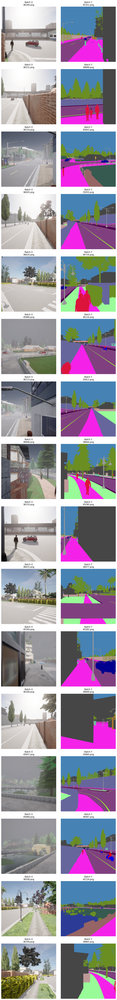

In [8]:
# Display one batch from training loader
# for batch_X, batch_Y in zip(loader_A['train'], loader_B['train']): pass
batch_X, batch_Y = next(zip(loader_A['train'], loader_B['train']))
images_X, filenames_X = batch_X  # Unpack images and filenames for X
images_Y, filenames_Y = batch_Y  # Unpack images and filenames for Y

print(f"Train batch X shape: {images_X.shape}, Y shape: {images_Y.shape}")

# Display all images in batch_X and batch_Y
n_images = len(images_X)
fig, axes = plt.subplots(n_images, 2, figsize=(10, 5 * n_images))

for i in range(n_images):
    # Display batch_X
    axes[i, 0].imshow(images_X[i].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Denormalize and convert to numpy
    axes[i, 0].set_title(f"Batch X\n{filenames_X[i]}")  # Annotate with filename
    axes[i, 0].axis("off")

    # Display batch_Y
    axes[i, 1].imshow(images_Y[i].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Denormalize and convert to numpy
    axes[i, 1].set_title(f"Batch Y\n{filenames_Y[i]}")  # Annotate with filename
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

# Model Architecture

## Helper modules

In [ ]:
# -----------------------------------------------------------------------------
#  Basic building blocks: DownBlock, UpBlock
# -----------------------------------------------------------------------------
class DownBlock(nn.Module):
    """
    A 4×4 Conv -> (BatchNorm) -> LeakyReLU block for encoder.
    """
    def __init__(self, in_channels, out_channels, normalize=True):
        super().__init__()
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1,
                            bias=not normalize)]
        if normalize:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

class UpBlock(nn.Module):
    """
    Upsample -> 3×3 Conv -> BatchNorm -> ReLU -> (optional Dropout)
    """
    def __init__(self, in_channels, out_channels, dropout=False):
        super().__init__()
        layers = [
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        ]
        if dropout:
            layers.append(nn.Dropout(0.5))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

# -----------------------------------------------------------------------------
#  Self-Attention module
# -----------------------------------------------------------------------------
class SelfAttention(nn.Module):
    """
    Integrates global context by learning attention across spatial positions.
    """
    def __init__(self, in_channels):
        super().__init__()
        self.query = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels//8, 1))
        self.key   = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels//8, 1))
        self.value = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels,    1))
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        b, c, h, w = x.size()
        # project and reshape
        q = self.query(x).view(b, -1, h*w).permute(0,2,1)  # b×N×C'
        k = self.key(x).view(b, -1, h*w)                   # b×C'×N
        attn = torch.softmax(torch.bmm(q, k), dim=-1)      # b×N×N
        v = self.value(x).view(b, -1, h*w).permute(0,2,1)   # b×N×C
        o = torch.bmm(attn, v).permute(0,2,1).view(b, c, h, w)
        return self.gamma * o + x

class GANLoss(nn.Module):
    """
    Define GAN loss objectives. Supports vanilla, lsgan, and wgangp.
    """
    def __init__(self, gan_mode='vanilla', target_real_label=1.0, target_fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(target_real_label))
        self.register_buffer('fake_label', torch.tensor(target_fake_label))
        self.gan_mode = gan_mode
        if gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
        elif gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode in ['wgangp']:
            self.loss = None
        else:
            raise NotImplementedError(f'gan_mode {gan_mode} not implemented')

    def get_target_tensor(self, prediction, target_is_real):
        """
        Create label tensor with same size as prediction.
        """
        target_tensor = self.real_label if target_is_real else self.fake_label
        return target_tensor.expand_as(prediction)

    def __call__(self, prediction, target_is_real):
        if self.gan_mode in ['lsgan', 'vanilla']:
            target_tensor = self.get_target_tensor(prediction, target_is_real)
            return self.loss(prediction, target_tensor)
        else:  # wgangp
            return -prediction.mean() if target_is_real else prediction.mean()

## U-Net Module

In [10]:
# -----------------------------------------------------------------------------
#  Generator: U-Net with optional Self-Attention at the bottleneck
# -----------------------------------------------------------------------------
class UNetGenerator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, ngf=64, use_attention=True):
        super().__init__()
        # Encoder: 8 down blocks
        self.downs = nn.ModuleList([
            DownBlock(in_channels, ngf, normalize=False),          # 256→128
            DownBlock(ngf, ngf*2),                                 # 128→64
            DownBlock(ngf*2, ngf*4),                               # 64→32
            DownBlock(ngf*4, ngf*8),                               # 32→16
            DownBlock(ngf*8, ngf*8),                               # 16→8
            DownBlock(ngf*8, ngf*8),                               # 8→4
            DownBlock(ngf*8, ngf*8),                               # 4→2
            DownBlock(ngf*8, ngf*8, normalize=False),              # 2→1 bottleneck
        ])
        # Optional self-attention at bottleneck
        self.attn = SelfAttention(ngf*8) if use_attention else nn.Identity()
        # Decoder: 8 up blocks (mirroring encoder)
        self.ups = nn.ModuleList([
            UpBlock(ngf*8, ngf*8, dropout=True),                  # 1→2
            UpBlock(ngf*16, ngf*8, dropout=True),                 # 2→4
            UpBlock(ngf*16, ngf*8, dropout=True),                 # 4→8
            UpBlock(ngf*16, ngf*8),                                # 8→16
            UpBlock(ngf*16, ngf*4),                                # 16→32
            UpBlock(ngf*8,  ngf*2),                                # 32→64
            UpBlock(ngf*4,  ngf),                                  # 64→128
        ])
        # Final layer: upsample + conv + Tanh
        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(ngf*2, out_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder forward
        skips = []
        for down in self.downs:
            x = down(x)
            skips.append(x)
        # Apply attention on deepest feature
        x = self.attn(x)
        # Decoder forward with skip-connections
        for i, up in enumerate(self.ups):
            skip = skips[-(i+2)]  # skip from corresponding encoder
            x = up(x)
            x = torch.cat([x, skip], dim=1)
        return self.final(x)

## Discriminator

In [11]:
# -----------------------------------------------------------------------------
#  Discriminator: 70×70 PatchGAN with optional attention
# -----------------------------------------------------------------------------
class PatchGANDiscriminator(nn.Module):
    def __init__(self, in_channels=6, ndf=64, use_attention=False):
        super().__init__()
        layers = []
        # input: (A,B) concat along channels
        layers += [nn.Conv2d(in_channels, ndf, 4, 2, 1), nn.LeakyReLU(0.2, inplace=True)]  # 256→128
        layers += [nn.Conv2d(ndf, ndf*2, 4, 2, 1), nn.BatchNorm2d(ndf*2), nn.LeakyReLU(0.2,True)]  #128→64
        layers += [nn.Conv2d(ndf*2, ndf*4, 4, 2, 1), nn.BatchNorm2d(ndf*4), nn.LeakyReLU(0.2,True)]  #64→32
        layers += [nn.Conv2d(ndf*4, ndf*8, 4, 1, 1), nn.BatchNorm2d(ndf*8), nn.LeakyReLU(0.2,True)]  #32→31
        self.model = nn.Sequential(*layers)
        self.attn = SelfAttention(ndf*8) if use_attention else nn.Identity()
        # final 4×4 conv to single logit map
        self.final = nn.Conv2d(ndf*8, 1, 4, 1, 1)  # 31→30

    def forward(self, x):
        x = self.model(x)
        x = self.attn(x)
        return self.final(x)

## Pix2Pix wrapper model

In [12]:
# -----------------------------------------------------------------------------
#  Complete Pix2Pix model: wraps generator, discriminator, losses, optimizers
# -----------------------------------------------------------------------------
class Pix2PixModel(nn.Module):
    def __init__(self,
                 in_channels=3, out_channels=3,
                 ngf=64, ndf=64,
                 lambda_L1=100.0,
                 gan_mode='vanilla',
                 init_type='normal', init_gain=0.02,
                 lr=2e-4, beta1=0.5, beta2=0.999,
                 device=torch.device('cpu'),
                 **kwargs):
        super().__init__()
        self.device = device
        self.lambda_L1 = lambda_L1

        # Generator and initialization
        self.netG = UNetGenerator(in_channels=in_channels, out_channels=out_channels,
                                  ngf=ngf, use_attention=kwargs.get('gen_attention', True))
        # initialize weights
        self.init_weights(self.netG, init_type, init_gain)
        self.netG.to(device)

        # Discriminator and initialization
        disc_in = in_channels + out_channels
        self.netD = PatchGANDiscriminator(in_channels=disc_in, ndf=ndf,
                                          use_attention=kwargs.get('disc_attention', False))
        
        self.init_weights(self.netD, init_type, init_gain)
        self.netD.to(device)

        # Loss functions
        self.criterionGAN = GANLoss(gan_mode=gan_mode).to(device)
        self.criterionL1  = nn.L1Loss().to(device)

        # Optimizers
        self.optG = torch.optim.Adam(self.netG.parameters(), lr=lr, betas=(beta1, beta2))
        self.optD = torch.optim.Adam(self.netD.parameters(), lr=lr, betas=(beta1, beta2))

    def forward(self, A):
        return self.netG(A)
    
    def init_weights(self, net, init_type='normal', init_gain=0.02):
        """
        Initialize network weights.
        Supports normal, xavier, kaiming, and orthogonal.
        """
        for m in net.modules():
            classname = m.__class__.__name__
            if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
                if init_type == 'normal':
                    nn.init.normal_(m.weight.data, 0.0, init_gain)
                elif init_type == 'xavier':
                    nn.init.xavier_normal_(m.weight.data, gain=init_gain)
                elif init_type == 'kaiming':
                    nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
                elif init_type == 'orthogonal':
                    nn.init.orthogonal_(m.weight.data, gain=init_gain)
                else:
                    raise NotImplementedError(f'init_type {init_type} not implemented')
                if hasattr(m, 'bias') and m.bias is not None:
                    nn.init.constant_(m.bias.data, 0.0)
            elif classname.find('BatchNorm2d') != -1:
                nn.init.normal_(m.weight.data, 1.0, init_gain)
                nn.init.constant_(m.bias.data, 0.0)

    def optimize(self, real_A, real_B):
        """
        Standard Pix2Pix update: GAN + L1
        """
        fake_B = self.forward(real_A)
        # Update Discriminator
        self.netD.requires_grad_(True)
        self.optD.zero_grad()
        real_pair = torch.cat([real_A, real_B], dim=1)
        pred_real = self.netD(real_pair)
        loss_D_real = self.criterionGAN(pred_real, True)
        fake_pair = torch.cat([real_A, fake_B.detach()], dim=1)
        pred_fake = self.netD(fake_pair)
        loss_D_fake = self.criterionGAN(pred_fake, False)
        loss_D = 0.5 * (loss_D_real + loss_D_fake)
        loss_D.backward()
        self.optD.step()

        # Update Generator
        self.netD.requires_grad_(False)
        self.optG.zero_grad()
        fake_pair = torch.cat([real_A, fake_B], dim=1)
        pred = self.netD(fake_pair)
        loss_G_GAN = self.criterionGAN(pred, True)
        loss_G_L1  = self.criterionL1(fake_B, real_B) * self.lambda_L1
        loss_G = loss_G_GAN + loss_G_L1
        loss_G.backward()
        self.optG.step()

        return {
            'D': loss_D.item(), 
            'G_GAN': loss_G_GAN.item(), 
            'G_L1': loss_G_L1.item(), 
            'loss_total': loss_G.item()
        }

    def optimize_cycle(self, real_A, real_B, G_inverse, lambda_cyc=10.0, lambda_id=5.0):
        """
        CycleGAN-style update: adversarial + cycle + identity losses
        """
        # Forward passes
        fake_B = self.forward(real_A)
        cycle_A = G_inverse(fake_B)
        fake_A  = G_inverse(real_B)
        cycle_B = self.forward(fake_A)

        # Identity mapping
        idt_B = self.forward(real_B)
        idt_A = G_inverse(real_A)

        # Loss terms
        loss_idt_B = self.criterionL1(idt_B, real_B) * lambda_id
        loss_idt_A = self.criterionL1(idt_A, real_A) * lambda_id
        loss_cycle_A = self.criterionL1(cycle_A, real_A) * lambda_cyc
        loss_cycle_B = self.criterionL1(cycle_B, real_B) * lambda_cyc

        # GAN loss for A->B
        fake_pair_AB = torch.cat([real_A, fake_B], dim=1)
        pred_fake_AB = self.netD(fake_pair_AB)
        loss_G_AB = self.criterionGAN(pred_fake_AB, True)

        # Total generator loss
        loss_G_total = loss_G_AB + loss_cycle_A + loss_cycle_B + loss_idt_A + loss_idt_B

        self.optG.zero_grad()
        loss_G_total.backward()
        self.optG.step()

        return {
            'G_GAN':    loss_G_AB.item(),
            'G_CYC_A':  loss_cycle_A.item(),
            'G_CYC_B':  loss_cycle_B.item(),
            'G_IDT_A':  loss_idt_A.item(),
            'G_IDT_B':  loss_idt_B.item(),
            'loss_total': loss_G_total.item()
        }
    
    def calculate_mse_psnr(self, pred, target):
        mse = F.mse_loss(pred, target, reduction='mean')
        return (mse, 10 * torch.log10(1.0 / mse).item())
    
    def validate(self, dataloader, device):
        total_mse, total_psnr = 0.0, 0.0
        sample = None
        rand_batch_idx = random.randint(0, len(dataloader) - 1)

        for i, batch in enumerate(dataloader):
            real_A, real_B = batch['A'].to(device), batch['B'].to(device)
            filenames = batch['path']

            with torch.no_grad():
                pred_B  = self(real_A)
                mse, psnr = self.calculate_mse_psnr(pred_B, real_B)

            total_mse += mse.item()
            total_psnr += psnr

            if i == rand_batch_idx:
                rand_idx = random.randint(0, real_A.size(0) - 1)
                sample = (
                    real_A[rand_idx].unsqueeze(0)[0],
                    pred_B[rand_idx].unsqueeze(0)[0],
                    real_B[rand_idx].unsqueeze(0)[0],
                    filenames[rand_idx]
                )
        avg_loss = total_mse / len(dataloader)
        avg_psnr = total_psnr / len(dataloader)
        return avg_loss, avg_psnr, sample
    
    def validate_cycle(self, dataloader, G_inverse, lambda_cyc, lambda_id, device):
        """
        Validate unpaired cycle training for AtoB and BtoA using paired loader.

        dataloader: iterable of dicts with keys 'A','B','path'
        G_inverse: the inverse generator (F) for BtoA if self is AtoB, or G for BtoA
        Returns:
            avg_loss_AB, avg_loss_BA, sample_AB, sample_BA
        sample_AB: (real_A, fake_B, cycle_A, A_path)
        sample_BA: (real_B, fake_A, cycle_B, B_path)
        """
        total_AB, total_BA = 0.0, 0.0
        sample_AB = None
        sample_BA = None
        rand_batch_idx = random.randint(0, len(dataloader) - 1)

        with torch.no_grad():
            for i, (batch_A, batch_B) in enumerate(dataloader):
                real_A, path_A = batch_A[0].to(device), batch_A[1]
                real_B, path_B = batch_B[0].to(device), batch_B[1]
    
                # Forward cycle
                fake_B = self(real_A)
                cycle_A = G_inverse(fake_B)
                fake_A = G_inverse(real_B)
                cycle_B = self(fake_A)
    
                # GAN losses
                pred_fake_B = self.netD(torch.cat([real_A, fake_B], dim=1))
                loss_gan_AB = self.criterionGAN(pred_fake_B, True)
                pred_fake_A = G_inverse.netD(torch.cat([real_B, fake_A], dim=1))
                loss_gan_BA = G_inverse.criterionGAN(pred_fake_A, True)
    
                # Cycle-consistency
                loss_cyc_A = self.criterionL1(cycle_A, real_A) * lambda_cyc
                loss_cyc_B = self.criterionL1(cycle_B, real_B) * lambda_cyc
    
                # Identity
                idt_B = self(real_B)
                loss_idt_B = self.criterionL1(idt_B, real_B) * lambda_id
                idt_A = G_inverse(real_A)
                loss_idt_A = self.criterionL1(idt_A, real_A) * lambda_id
    
                loss_AB = loss_gan_AB + loss_cyc_A + loss_idt_B
                loss_BA = loss_gan_BA + loss_cyc_B + loss_idt_A
    
                total_AB += loss_AB.item()
                total_BA += loss_BA.item()
    
                if i == rand_batch_idx:
                    rand_idx = random.randint(0, real_A.size(0) - 1)
                    sample_AB = (
                        real_A[rand_idx].unsqueeze(0)[0],
                        fake_B[rand_idx].unsqueeze(0)[0],
                        cycle_A[rand_idx].unsqueeze(0)[0],
                        path_A[rand_idx]
                    )
    
                    sample_BA = (
                        real_B[rand_idx].unsqueeze(0)[0],
                        fake_A[rand_idx].unsqueeze(0)[0],
                        cycle_B[rand_idx].unsqueeze(0)[0],
                        path_B[rand_idx]
                    )

        avg_AB = total_AB / len(dataloader)
        avg_BA = total_BA / len(dataloader)
        return avg_AB, avg_BA, sample_AB, sample_BA


# Training & evaluating

## Model Initialization

In [13]:
Models = {
    'AtoB': Pix2PixModel(**pix2pix_arg, device=device).to(device),
    'BtoA': Pix2PixModel(**pix2pix_arg, device=device).to(device)
}

## Training

In [14]:
# Helper functions that visualize images
def visualize_images(images, labels, title=None, denorm_fn=lambda x : x * 0.5 + 0.5):
    """
    images: list of Tensors or numpy arrays (C×H×W) or (H×W×C)
    labels: list of str, same length as images
    title:  optional overall figure title
    denorm_fn: optional function to denormalize tensors before display
    """
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=(4 * n, 4))

    if n == 1:
        axes = [axes]

    for ax, img, lab in zip(axes, images, labels):
        if hasattr(img, 'permute'):  # it's a Tensor
            if denorm_fn:
                img = denorm_fn(img)
            if img.requires_grad:
                img = img.permute(1, 2, 0).cpu().detach().numpy()
            else:
                img = img.permute(1, 2, 0).cpu().numpy()

        img = img.astype('float32')  # ensure correct dtype
        img = img.clip(0, 1)         # clamp to [0,1]
        ax.imshow(img)
        ax.set_title(lab)
        ax.axis("off")

    if title:
        fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()
    return fig


### Stage 1: Paired Pix2Pix Training

Epoch 1/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


Epoch 2/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.38it/s]


Epoch 3/15


Validating AtoB: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]


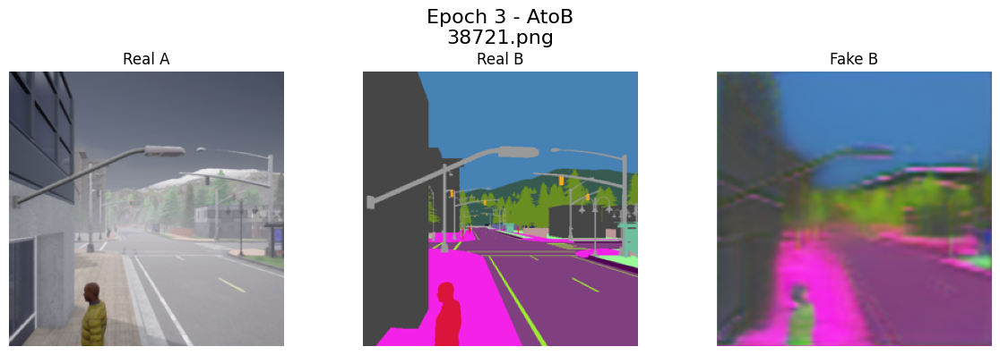

Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


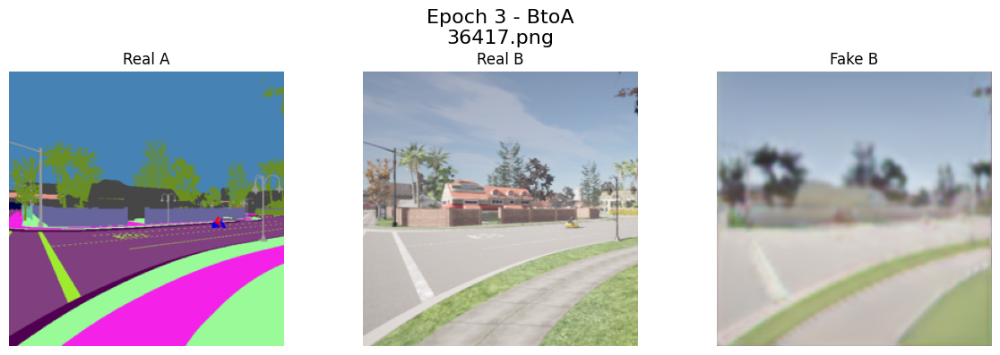

Epoch 4/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.38it/s]


Epoch 5/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]


Epoch 6/15


Validating AtoB: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]


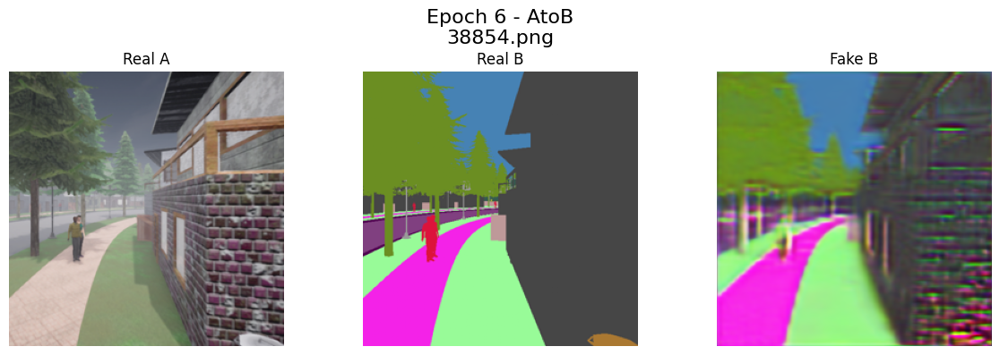

Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


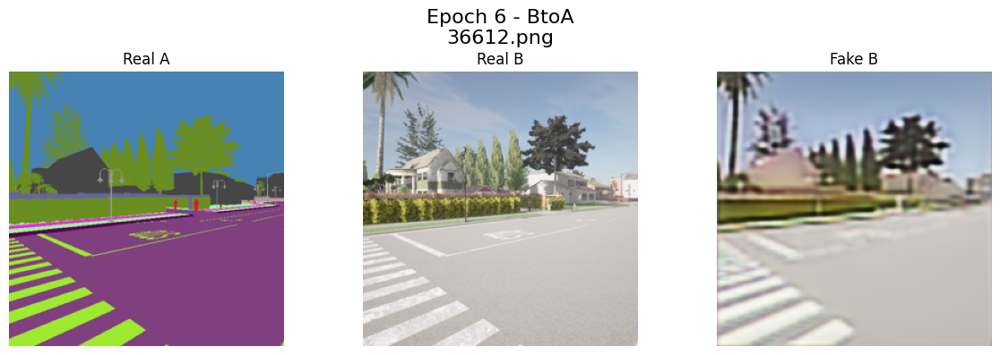

Epoch 7/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.35it/s]


Epoch 8/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


Epoch 9/15


Validating AtoB: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]


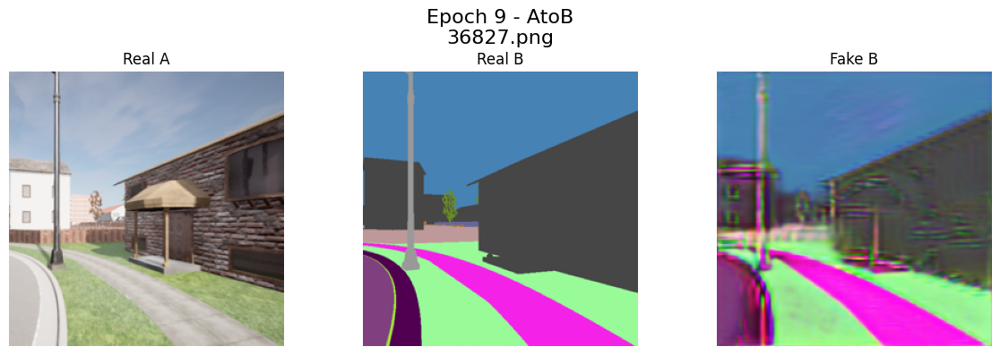

Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]


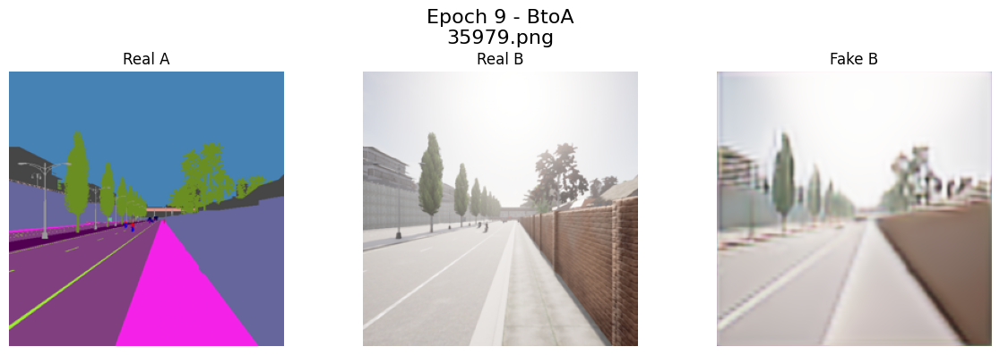

Epoch 10/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.35it/s]


Epoch 11/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


Epoch 12/15


Validating AtoB: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


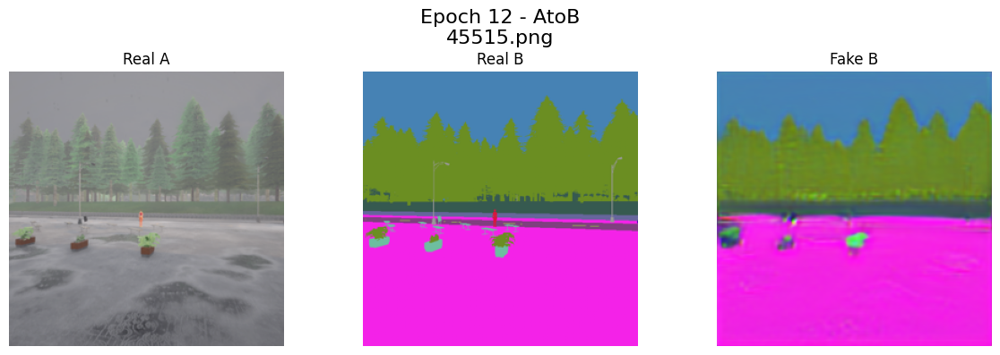

Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.35it/s]


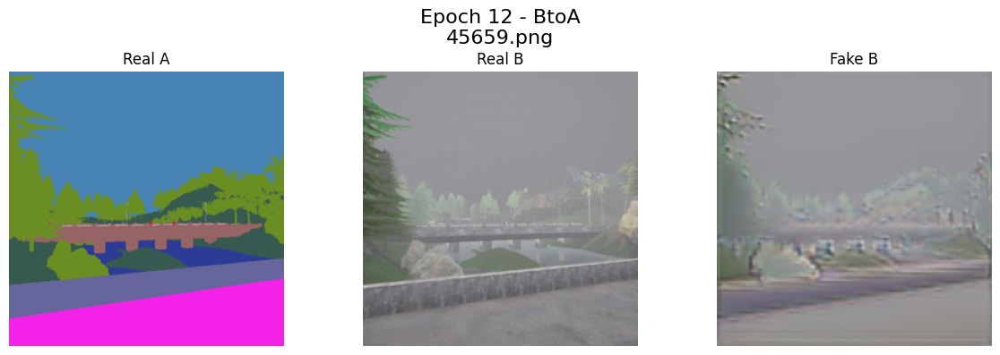

Epoch 13/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


Epoch 14/15


Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.35it/s]


Epoch 15/15


Validating AtoB: 100%|██████████| 14/14 [00:10<00:00,  1.34it/s]


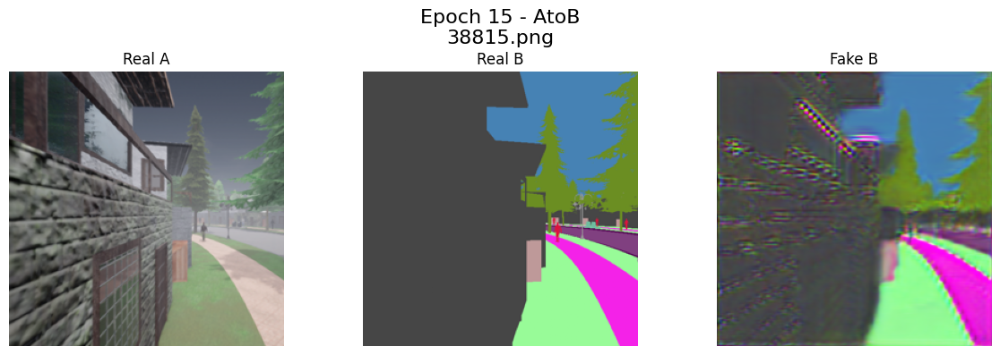

Validating BtoA: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]


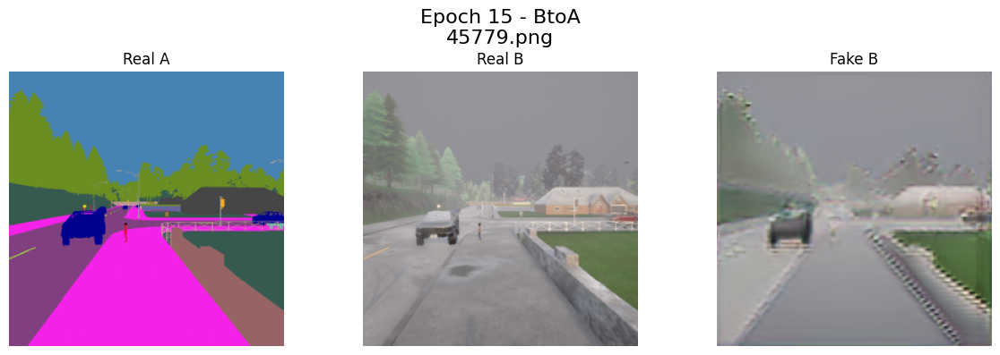

In [15]:
# Keep track of best validation loss
psnr_history = {'AtoB': [], 'BtoA': []}
loss_history = {'AtoB': [], 'BtoA': []}
best_val_loss = {'AtoB': float('inf'), 'BtoA': float('inf')}

for epoch in range(1, stage1_epochs + 1):
    print(f"Epoch {epoch}/{stage1_epochs}")
    for direction in ['AtoB', 'BtoA']:
        Models[direction].train()
        avg_loss = 0.0

        # Training
        train_loader = tqdm(pairs[direction]['train'], desc=f"Training {direction}")
        for batch in train_loader:
            real_A, real_B = batch['A'].to(device), batch['B'].to(device)
            loss = Models[direction].optimize(real_A, real_B)
            avg_loss += loss['loss_total']
            train_loader.set_postfix(loss=loss)

        avg_loss /= len(pairs[direction]['train'])  # Average training loss for the epoch

        # Validation
        Models[direction].eval()
        val_loader = tqdm(pairs[direction]['val'], desc=f"Validating {direction}")
        avg_val_loss, avg_psnr, sample = Models[direction].validate(val_loader, device)

        # Save the best model based on validation loss
        if avg_val_loss < best_val_loss[direction]:
            best_val_loss[direction] = avg_val_loss
            torch.save({
                'model_state_dict': Models[direction].state_dict(),
                'optimizer_state_dict': Models[direction].optG.state_dict(),
                'best_val_loss': best_val_loss[direction]
            }, f'checkpoints/stage1_best_model_{direction}.pth')

        # Visualize and save images every n_visualize epochs
        if epoch % n_visualize == 0:
            real_A, fake_B, real_B, filename = sample
            result = visualize_images(
                [real_A, real_B, fake_B],
                ["Real A", "Real B", "Fake B"],
                title=f"Epoch {epoch} - {direction}\n{filename}"
            )
            result.savefig(f'results/stage1/epoch_{epoch}_{direction}.png')

        psnr_history[direction].append(avg_psnr)
        loss_history[direction].append({'train_loss': avg_loss, 'val_loss': avg_val_loss})

Plot the training and validation loss curves for both directions, as well as the PSNR curves.Plot the

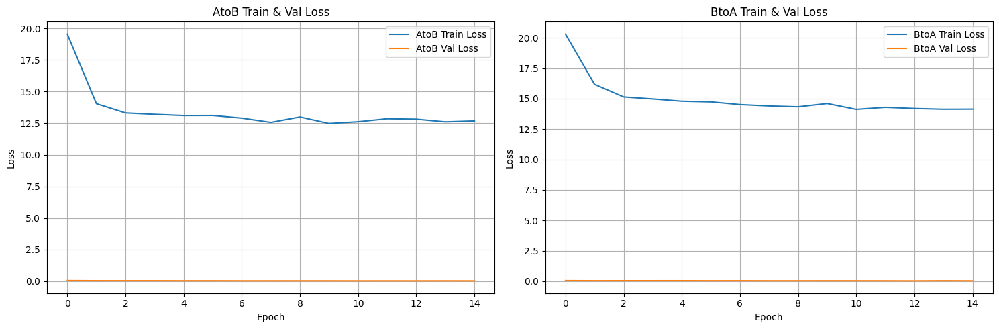

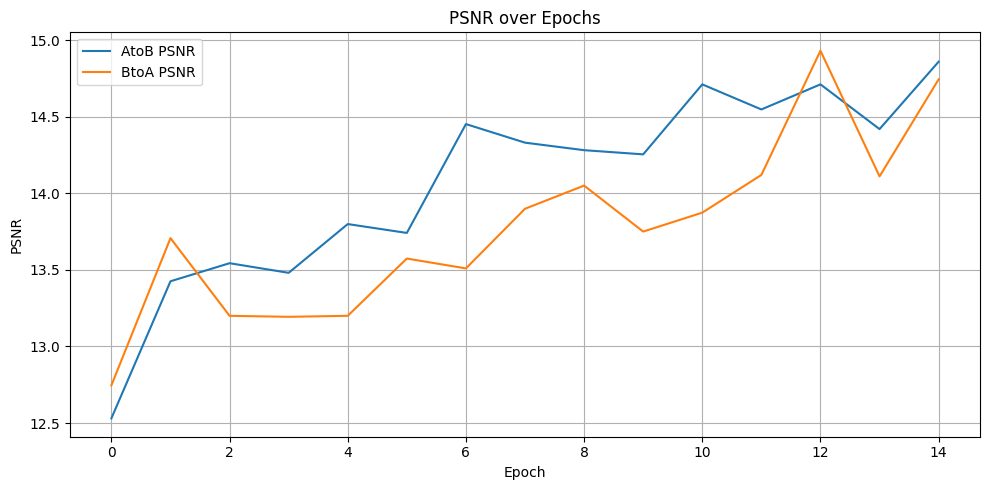

In [16]:
# Plot train and validation loss curves
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
for i, direction in enumerate(['AtoB', 'BtoA']):
    train_losses = [entry['train_loss'] for entry in loss_history[direction]]
    val_losses = [entry['val_loss'] for entry in loss_history[direction]]
    axes[i].plot(train_losses, label=f"{direction} Train Loss")
    axes[i].plot(val_losses, label=f"{direction} Val Loss")
    axes[i].set_xlabel('Epoch')
    axes[i].set_ylabel('Loss')
    axes[i].set_title(f'{direction} Train & Val Loss')
    axes[i].legend()
    axes[i].grid(True)
plt.tight_layout()
plt.show()

# Plot PSNR curves
plt.figure(figsize=(10, 5))
for direction in ['AtoB', 'BtoA']:
    plt.plot(psnr_history[direction], label=f"{direction} PSNR")
plt.xlabel('Epoch')
plt.ylabel('PSNR')
plt.title('PSNR over Epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Stage 2: Cyclic Pix2Pix Training

/tmp/ipykernel_19/148888234.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f'checkpoints/stage1_best_model_{direction}.pth', map_location=device)


Loaded stage1_best_model_AtoB.pth, val_loss=0.0328
Loaded stage1_best_model_BtoA.pth, val_loss=0.0336
Epoch 1/15


Validating Epoch 1: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]


Epoch 2/15


Validating Epoch 2: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]


Epoch 3/15


Validating Epoch 3: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]


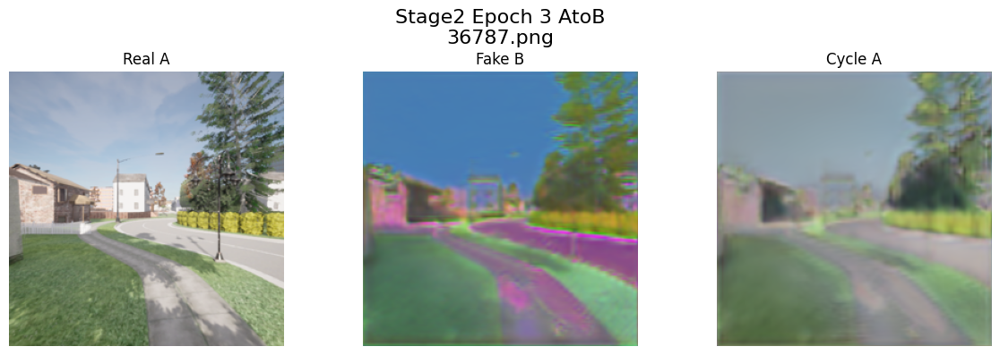

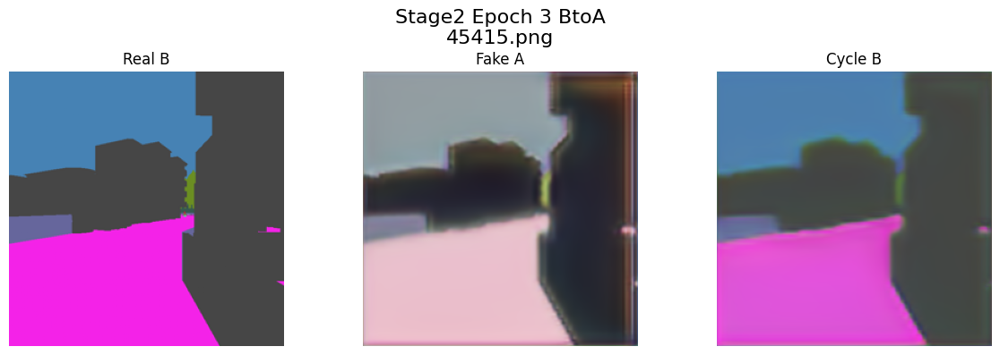

Epoch 4/15


Validating Epoch 4: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]


Epoch 5/15


Validating Epoch 5: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]


Epoch 6/15


Validating Epoch 6: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]


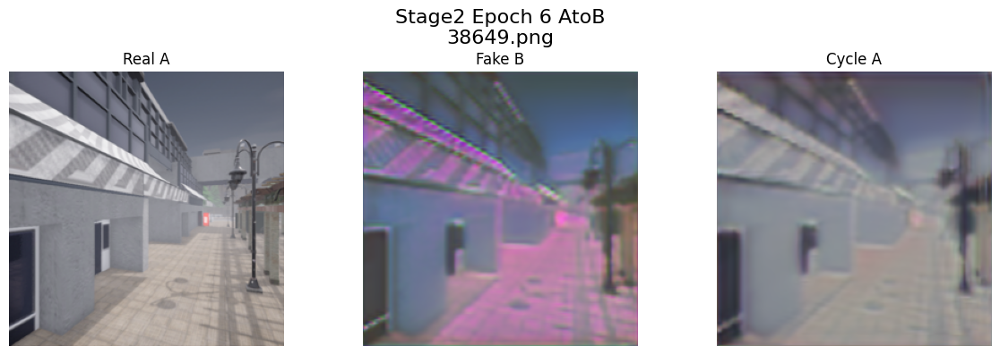

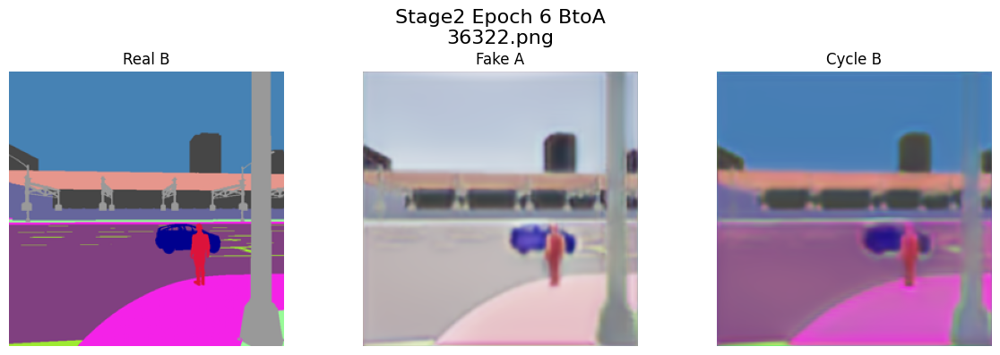

Epoch 7/15


Validating Epoch 7: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]


Epoch 8/15


Validating Epoch 8: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]


Epoch 9/15


Validating Epoch 9: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]


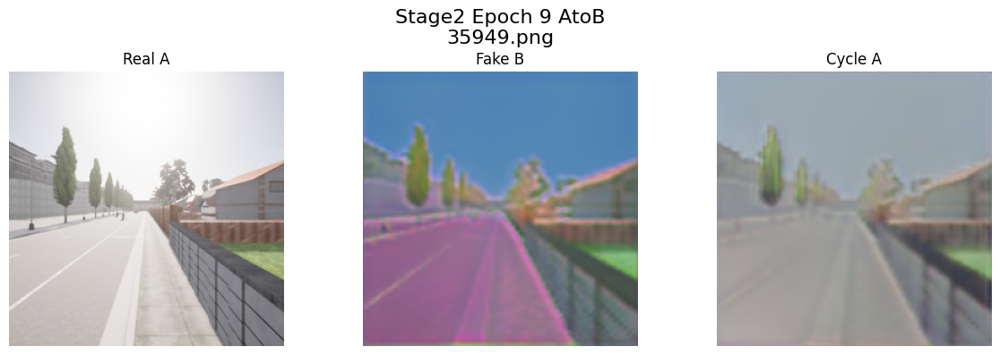

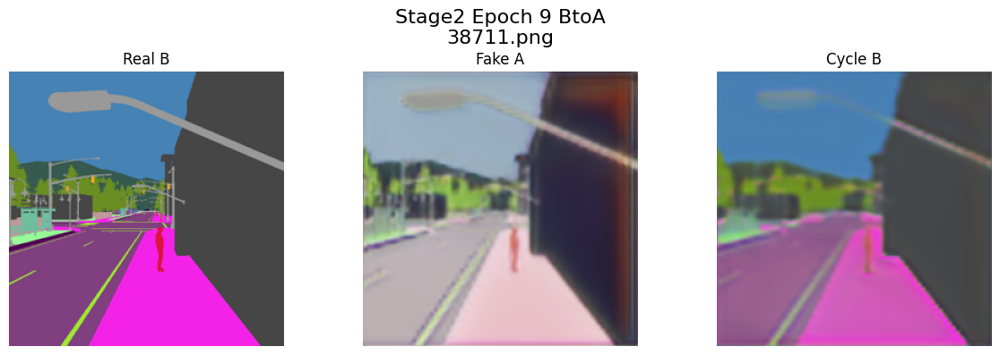

Epoch 10/15


Validating Epoch 10: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]


Epoch 11/15


Validating Epoch 11: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]


Epoch 12/15


Validating Epoch 12: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]


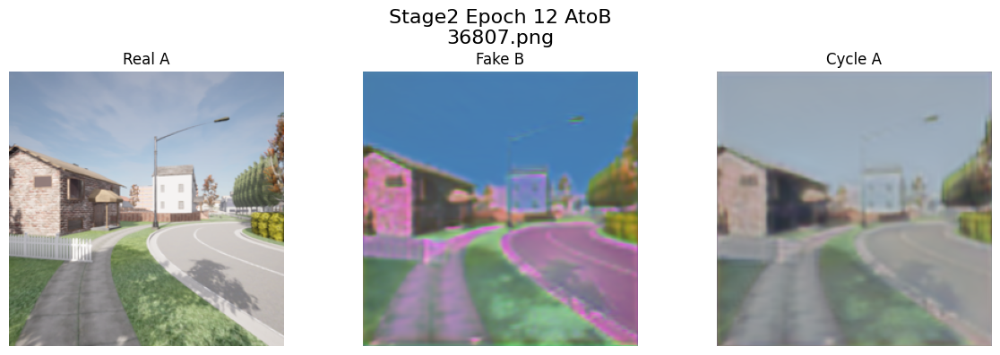

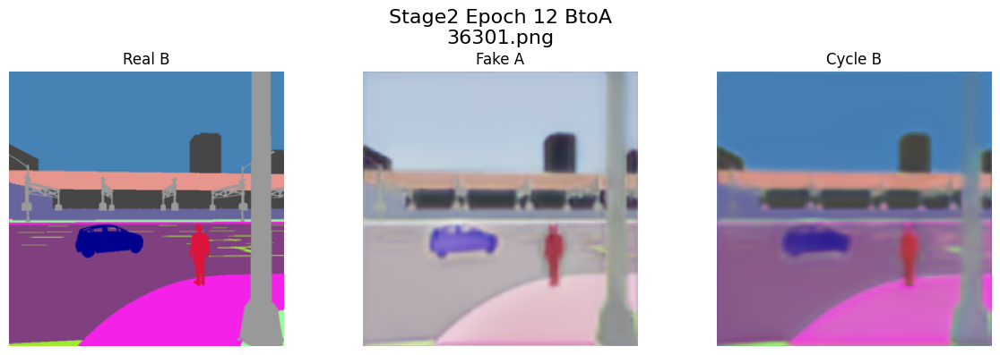

Epoch 13/15


Validating Epoch 13: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]


Epoch 14/15


Validating Epoch 14: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]


Epoch 15/15


Validating Epoch 15: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]


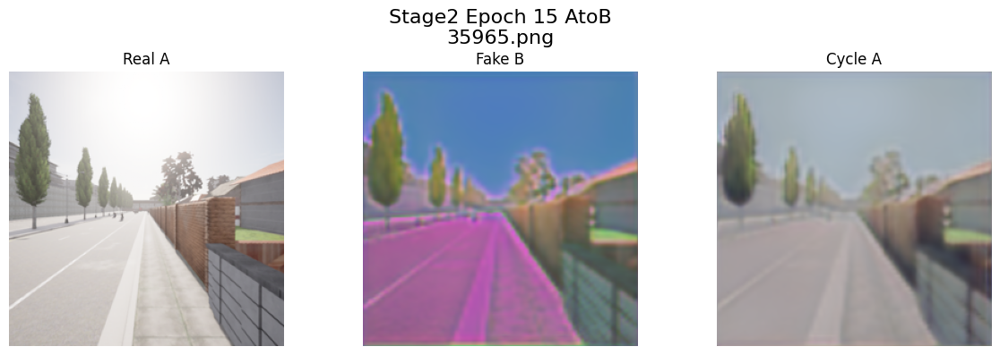

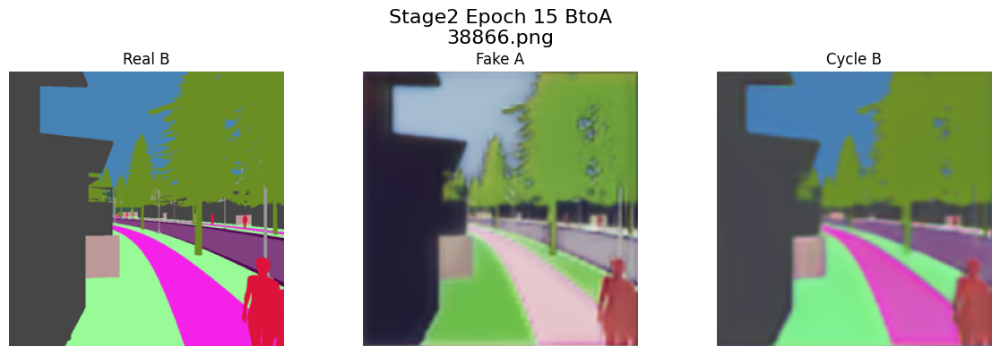

In [17]:
# Initialize history dictionaries
psnr_history = {'AtoB': [], 'BtoA': []}
loss_history = {'AtoB': [], 'BtoA': []}
best_val_loss = {'AtoB': float('inf'), 'BtoA': float('inf')}

def load_best(direction):
    ckpt = torch.load(f'checkpoints/stage1_best_model_{direction}.pth', map_location=device)
    Models[direction].load_state_dict(ckpt['model_state_dict'])
    print(f"Loaded stage1_best_model_{direction}.pth, val_loss={ckpt['best_val_loss']:.4f}")

load_best('AtoB')
load_best('BtoA')

for epoch in range(1, stage2_epochs+1):
    print(f"Epoch {epoch}/{stage2_epochs}")
    # Training
    avg_loss_AB, avg_loss_BA = 0.0 , 0.0
    Models['AtoB'].train()
    Models['BtoA'].train()
    train_loader = tqdm(zip(loader_A['train'], loader_B['train']), desc=f"Training Epoch {epoch}", total=len(loader_A['train']))
    for batch_X, batch_Y in train_loader:
        real_X, real_Y = batch_X[0].to(device), batch_Y[0].to(device)
        out_AB = Models['AtoB'].optimize_cycle(real_X, real_Y, Models['BtoA'], pix2pix_arg["lambda_cyc"], pix2pix_arg["lambda_id"])
        out_BA = Models['BtoA'].optimize_cycle(real_Y, real_X, Models['AtoB'], pix2pix_arg["lambda_cyc"], pix2pix_arg["lambda_id"])
        avg_loss_AB += out_AB['loss_total']
        avg_loss_BA += out_BA['loss_total']
        train_loader.set_postfix(AtoB_loss=out_AB['loss_total'], BtoA_loss=out_BA['loss_total'])
    
    avg_loss_AB /= len(loader_A['train'])
    avg_loss_BA /= len(loader_B['train'])

    # Validation via paired loader for Stage2
    Models['AtoB'].eval()
    Models['BtoA'].eval()
    val_loader = tqdm(zip(loader_A['val'], loader_B['val']), desc=f"Validating Epoch {epoch}", total=len(loader_A['val']))
    avg_val_loss_AB, avg_val_loss_BA, sample_AB, sample_BA = Models['AtoB'].validate_cycle(val_loader, Models['BtoA'], pix2pix_arg["lambda_cyc"], pix2pix_arg["lambda_id"], device)

    # Save best models
    for direction, loss_val in zip(['AtoB','BtoA'], [avg_val_loss_AB, avg_val_loss_BA]):
        if loss_val < best_val_loss[direction]:
            best_val_loss[direction] = loss_val
            torch.save({
                'model_state_dict': Models[direction].state_dict(),
                'optimizer_state_dict': Models[direction].optG.state_dict(),
                'best_val_loss': loss_val
            }, f'checkpoints/stage2_best_model_{direction}.pth')

    # Visualize & save every n_visualize epochs
    if epoch % n_visualize == 0:
        # AtoB visualize
        real_A, fake_B, reverse_A, filename = sample_AB
        fig = visualize_images(
            [real_A, fake_B, reverse_A],
            ["Real A","Fake B", "Cycle A"],
            title=f"Stage2 Epoch {epoch} AtoB\n{filename}"
        )

        # BtoA visualize
        real_B, fake_A, reverse_B, filename = sample_BA
        fig = visualize_images(
            [real_B, fake_A, reverse_B],
            ["Real B", "Fake A", "Cycle B"],
            title=f"Stage2 Epoch {epoch} BtoA\n{filename}"
        )
        fig.savefig(f"results/stage2/epoch_{epoch}_AtoB.png")
        fig.savefig(f"results/stage2/epoch_{epoch}_BtoA.png")
    loss_history['AtoB'].append({'train_loss': avg_loss_AB, 'val_loss': avg_val_loss_AB})
    loss_history['BtoA'].append({'train_loss': avg_loss_BA, 'val_loss': avg_val_loss_BA})

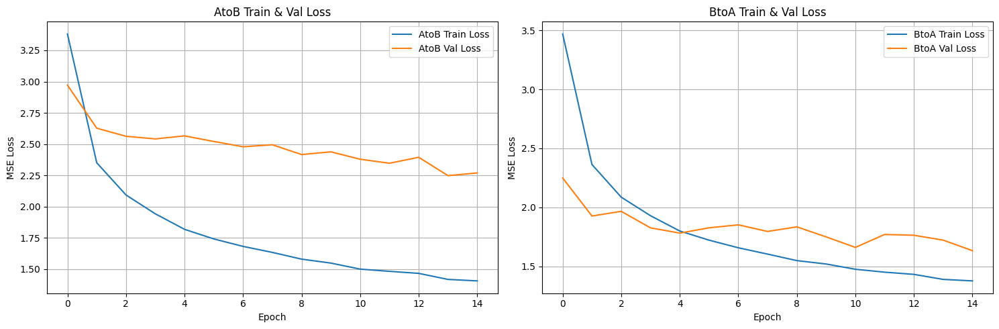

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # Create subplots for side-by-side comparison

for i, direction in enumerate(['AtoB', 'BtoA']):
    train_losses = [entry['train_loss'] for entry in loss_history[direction]]
    val_losses = [entry['val_loss'] for entry in loss_history[direction]]
    axes[i].plot(train_losses, label=f'{direction} Train Loss')
    axes[i].plot(val_losses, label=f'{direction} Val Loss')
    axes[i].set_xlabel('Epoch')
    axes[i].set_ylabel('MSE Loss')
    axes[i].set_title(f'{direction} Train & Val Loss')
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()


## Testing

/tmp/ipykernel_19/400521205.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f'checkpoints/{stage}_best_model_{direction}.pth', map_location=device)


Loaded stage1_best_model_AtoB.pth, val_loss=0.0328
Loaded stage1_best_model_BtoA.pth, val_loss=0.0336
Loaded stage2_best_model_AtoB.pth, val_loss=2.2484
Loaded stage2_best_model_BtoA.pth, val_loss=1.6328


Testing AtoB (stage1): 100%|██████████| 14/14 [00:10<00:00,  1.33it/s, Sample 13=MSE=0.1318, PSNR=8.80 dB]


AtoB (stage1) Average Test MSE: 0.0379, PSNR: 14.69 dB


Testing BtoA (stage1): 100%|██████████| 14/14 [00:10<00:00,  1.37it/s, Sample 13=MSE=0.0896, PSNR=10.48 dB]


BtoA (stage1) Average Test MSE: 0.0399, PSNR: 14.29 dB


Testing AtoB (stage2): 100%|██████████| 14/14 [00:10<00:00,  1.40it/s, Sample 13=MSE=0.3941, PSNR=4.04 dB]


AtoB (stage2) Average Test MSE: 0.2422, PSNR: 6.22 dB


Testing BtoA (stage2): 100%|██████████| 14/14 [00:09<00:00,  1.40it/s, Sample 13=MSE=0.3349, PSNR=4.75 dB]


BtoA (stage2) Average Test MSE: 0.2578, PSNR: 5.91 dB


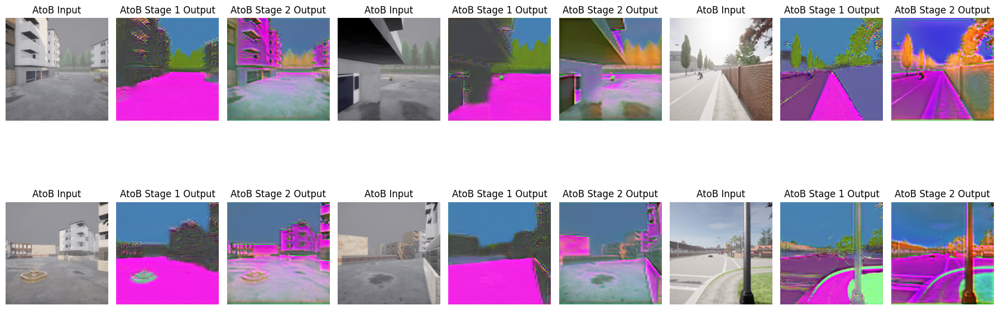

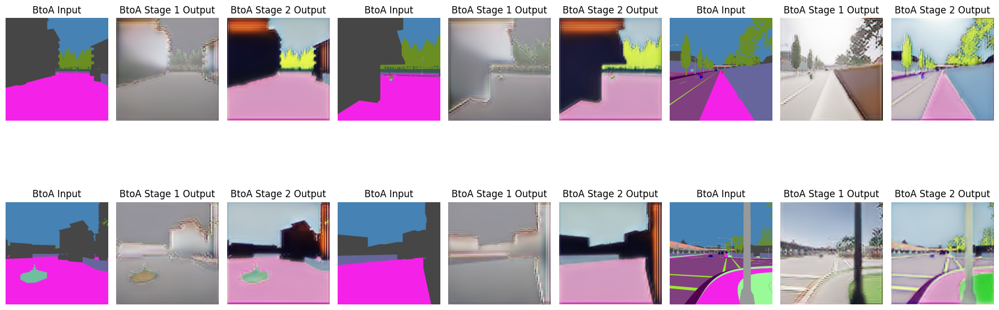

Testing and visualization completed.


In [19]:
# Combined testing and visualization for stage 1 and stage 2 models
Test_Models = {
    'AtoB_stage1': Pix2PixModel(**pix2pix_arg, device=device).to(device),
    'BtoA_stage1': Pix2PixModel(**pix2pix_arg, device=device).to(device),
    'AtoB_stage2': Pix2PixModel(**pix2pix_arg, device=device).to(device),
    'BtoA_stage2': Pix2PixModel(**pix2pix_arg, device=device).to(device)
}

def load_best(direction, stage):
    ckpt = torch.load(f'checkpoints/{stage}_best_model_{direction}.pth', map_location=device)
    model_key = f"{direction}_{stage}"
    Test_Models[model_key].load_state_dict(ckpt['model_state_dict'])
    print(f"Loaded {stage}_best_model_{direction}.pth, val_loss={ckpt['best_val_loss']:.4f}")

# Load models for both stages
load_best('AtoB', 'stage1')
load_best('BtoA', 'stage1')
load_best('AtoB', 'stage2')
load_best('BtoA', 'stage2')

# Initialize dictionaries to store results
test_results = {'stage1': {'AtoB': [], 'BtoA': []}, 'stage2': {'AtoB': [], 'BtoA': []}}
result_images = {'stage1': {'AtoB': [], 'BtoA': []}, 'stage2': {'AtoB': [], 'BtoA': []}}

# Function to test models
def test_models(stage, models, results, images):
    for direction in ['AtoB', 'BtoA']:
        mse_total, psnr_total, sample_count = 0.0, 0.0, 0
        test_loaders = tqdm(pairs[direction]['test'], desc=f"Testing {direction} ({stage})", total=len(pairs[direction]['test']))
        for i, batch in enumerate(test_loaders):
            real_A, real_B = batch['A'].to(device), batch['B'].to(device)
            with torch.no_grad():
                model_key = f"{direction}_{stage}"
                fake_B = models[model_key](real_A)
            mse, psnr = models[model_key].calculate_mse_psnr(fake_B, real_B)
            results[direction].append({'mse': mse, 'psnr': psnr})
            mse_total += mse
            psnr_total += psnr
            sample_count += 1
            test_loaders.set_postfix({f"Sample {i}": f"MSE={mse:.4f}, PSNR={psnr:.2f} dB"})
            images[direction].append((real_A[0], fake_B[0]))

        avg_mse = mse_total / sample_count
        avg_psnr = psnr_total / sample_count
        print(f"{direction} ({stage}) Average Test MSE: {avg_mse:.4f}, PSNR: {avg_psnr:.2f} dB")

# Test stage 1 models
test_models('stage1', Test_Models, test_results['stage1'], result_images['stage1'])

# Test stage 2 models
test_models('stage2', Test_Models, test_results['stage2'], result_images['stage2'])

# Visualization of results
for direction in ['AtoB', 'BtoA']:
    images_stage1 = result_images['stage1'][direction][:6]  # Limit to 6 samples
    images_stage2 = result_images['stage2'][direction][:6]  # Limit to 6 samples
    n_images = len(images_stage1)
    n_cols = min(3, n_images)  # Limit columns to 3 for better readability
    n_rows = math.ceil(n_images / n_cols)  # Calculate rows based on total images and columns
    fig, axes = plt.subplots(n_rows, n_cols * 3, figsize=(6 * n_cols, 4 * n_rows))  # Adjust canvas size

    if n_rows == 1:
        axes = axes[np.newaxis, :]  # Ensure axes are 2D for consistent indexing
    elif n_images == 1:
        axes = np.array([[axes]])  # Handle single image case

    for i, ((real, fake1), (_, fake2)) in enumerate(zip(images_stage1, images_stage2)):
        row, col = divmod(i, n_cols)
        # Display real image
        axes[row, col * 3].imshow(real.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Denormalize
        axes[row, col * 3].set_title(f"{direction} Input")
        axes[row, col * 3].axis("off")

        # Display stage 1 fake image
        axes[row, col * 3 + 1].imshow(fake1.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Denormalize
        axes[row, col * 3 + 1].set_title(f"{direction} Stage 1 Output")
        axes[row, col * 3 + 1].axis("off")

        # Display stage 2 fake image
        axes[row, col * 3 + 2].imshow(fake2.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Denormalize
        axes[row, col * 3 + 2].set_title(f"{direction} Stage 2 Output")
        axes[row, col * 3 + 2].axis("off")

    plt.tight_layout()
    plt.show()

print("Testing and visualization completed.")
